# CISC642 HW 1
## Amani Kiruga
* The point picker uses matplotlib tkinter backend. It is buggy and if you don't see red crosses, run the cell again

In [10]:
# Import libraries
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np 
from __future__ import print_function


In [2]:
#%matplotlib notebook
%matplotlib inline

In [13]:
# default size of plots
plt.rcParams['figure.figsize'] = [9.5, 6]

# Affine and Projective Transformations
#### Load images

In [11]:
# Parliment picture
parliament = cv.imread("parliament.jpg")

Text(0.5, 1.0, 'Parliament')

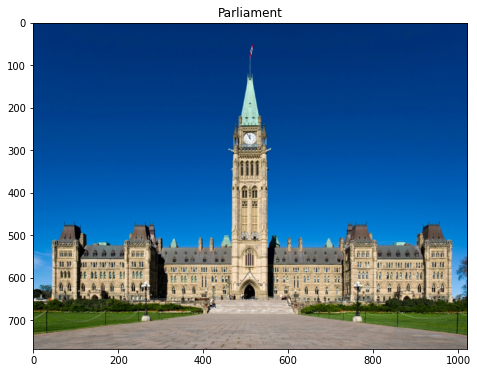

In [14]:
plt.imshow(parliament[:, :, ::-1])
plt.title("Parliament")

#### Affine Transformation with OpenCV

<class 'numpy.ndarray'>
[[0.5 0.  0. ]
 [0.  0.5 0. ]]


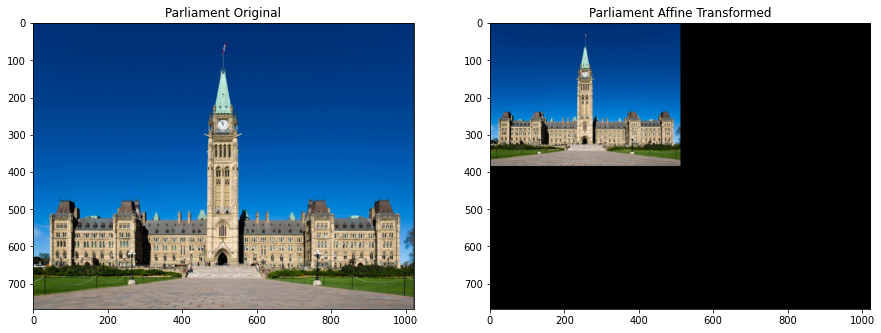

In [9]:
src_pts = np.float32([[110, 60], [32, 46], [98, 86]]) 
dest_pts = np.float32(src_pts//2) #scale by 2
print(type(src_pts))

# get transformation matrix
tran = cv.getAffineTransform(src_pts, dest_pts) 
print(tran)

#transform image with OpenCV
tran_img = cv.warpAffine(parliament, tran, (parliament.shape[1], parliament.shape[0]))

fig = plt.figure(figsize=(15, 15))
fig.add_subplot(121)
plt.imshow(parliament[:,:,::-1]) #Original image
plt.title("Parliament Original")
fig.add_subplot(122)
plt.imshow(tran_img[:,:,::-1]) # Transformed image
plt.title("Parliament Affine Transformed")
plt.show()

#### Projective Transformation with OpenCV

<class 'numpy.ndarray'>


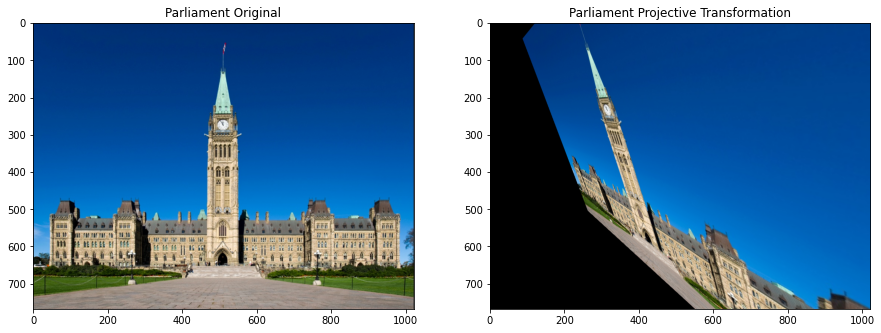

In [10]:
src_pts_h = np.float32([[110, 60], [700, 250], [400, 800], [670,980]])
dest_pts_h = np.float32([[120, 70], [448, 205], [ 405, 650], [630, 970]]) #Random correspondances
print(type(src_pts_h))

# Getting transformation matrix 
tran_h = cv.getPerspectiveTransform(src_pts_h, dest_pts_h) 
tran_img_h = cv.warpPerspective(parliament, tran_h, (parliament.shape[1], parliament.shape[0])) #transforming image


fig = plt.figure(figsize=(15, 15))
fig.add_subplot(121)
plt.imshow(parliament[:, :, ::-1])
plt.title("Parliament Original")
fig.add_subplot(122)
plt.imshow(tran_img_h[:, :, ::-1])
plt.title("Parliament Projective Transformation")
plt.show()

### Writing Affine and Homography Transformation Solver 

In [18]:
def pick_points_img(img, num_of_pts):
    '''
    Allows user to pick points from an image
    img: image to be plotted
    num_of_pts: number of points to be chosen 
    Returns: List of Tuples of image coordinates chosen 
    Using Matplotlib tkinter backend can be buggy, it might need to be rerun 2 or more times to work
    '''
    #to allow interactive plots and picking of points
    %matplotlib tk 
    
    assert num_of_pts>0
    
    plt.imshow(img) # plotting image 
    pts = [] # list to be outputed
    print("Please click correspondances")
    x = plt.ginput(num_of_pts, timeout=75) #allows for points to be picked
    print("clicked", x)
    pts = x 
    plt.show() # plotting...
    return pts

def get_affine(src_pts, dest_pts): 
    '''
    Function that uses least squares method to solve for affine transformation matrix. 
    src_pts: source points from untransformed image
    dest_pts: destination points from transformed image
    Returns: 2 x 3 transformation matrix 
    If system is overconstrained the system and pseudoinverse will be calculated see https://numpy.org/doc/stable/reference/generated/numpy.linalg.lstsq.html 
    '''
    assert len(src_pts) == len(dest_pts) != 0
    
    x_prime = dest_pts.reshape((-1,1)) #b in Ax = b
    p1 = np.vstack([src_pts.T,np.ones(src_pts.T.shape[1])]).T # rewrite in homogenous coordinates
    X = None # x in Ax = b
    B = None # A in Ax = b
    #print("here", len(p1), p1, x_prime.shape)
    
    # Using class handout for solving affine transformation
    for idr in range(src_pts.shape[0]): 
        s1 = np.zeros(6)
        s1[:3] = p1[idr]
        s2 = np.zeros(6)
        s2[3:] = p1[idr]
        if(X is None): 
            X = s1
            X = np.vstack([X, s2])
        else: 
            X = np.vstack([X, s1, s2])
    #print(X)
    #print(x_prime)
    return np.linalg.lstsq(X, x_prime, rcond = False)[0]

def get_homography(src_pts, dest_pts): 
    '''
    Function that uses least squares method to solve for homography transformation matrix 
    src_pts: source points from untransformed image
    dest_pts: destination points from transformed image
    Returns: 3 x 3 homography matrix     
    If system is overconstrained the system and pseudoinverse will be calculated see https://numpy.org/doc/stable/reference/generated/numpy.linalg.lstsq.html 
    '''
    x_prime = dest_pts.reshape((-1,1)) # b in Ax = b
    p1 = np.vstack([src_pts.T,np.ones(src_pts.T.shape[1])]).T
    p2 = np.vstack([dest_pts.T, np.ones(src_pts.T.shape[1])]).T
    X = None # x in Ax = b
    B = None # A in Ax = b
    #print("here", len(p1), p1, x_prime.shape)
    #print("here", len(p2), p2, x_prime.shape)
    
    #solved using class handout for solving homography transformation matrix
    for idr in range(src_pts.shape[0]): 
        s1 = np.zeros(8)
        s1[:3] = p1[idr]
        s1[6:] = np.array([-p1[idr][0]*p2[idr][0],-p1[idr][1]*p2[idr][0]])
        s2 = np.zeros(8)
        s2[3:6] = p1[idr]
        s2[6:] = np.array([-p1[idr][0]*p2[idr][1],-p1[idr][1]*p2[idr][1]])
        if(X is None): 
            X = s1
            X = np.vstack([X, s2])
        else: 
            X = np.vstack([X, s1, s2])
    #print(X)
    return np.linalg.lstsq(X, x_prime, rcond = False)[0]


#### Affine Transformation Solve 
Note: Sometimes picking points doesn't work first time, if it's unresponsive try again

In [19]:
# Picking source points
picked_src_pts = pick_points_img(parliament[:, :, ::-1], 3)

Please click correspondances
clicked [(509.24865972879206, 129.31646168401141), (299.3464206874802, 508.75512456638285), (723.9947965941342, 510.369757174393)]


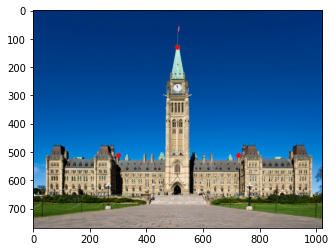

In [20]:
picked_src_pts = [list(x) for x in picked_src_pts]
picked_src_pts = np.asarray(picked_src_pts)

#print(picked_src_pts)

#return to inline from interactive
%matplotlib inline

#showing picked points on image 
plt.imshow(parliament[:, :, ::-1])
plt.scatter(x = picked_src_pts[:, 0],y= picked_src_pts[:, 1], color='red', s=12)
plt.show()


In [21]:
#picking destination points
picked_dest_pts = pick_points_img(tran_img[:, :, ::-1], 3)


Please click correspondances
clicked [(253.91469567959632, 67.9604225796279), (150.57820876695052, 255.2578051087985), (360.4804478082624, 255.2578051087985)]


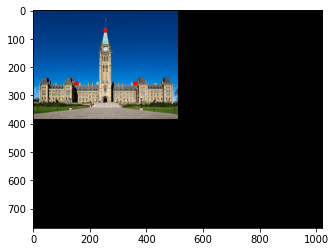

In [23]:
picked_dest_pts = [list(x) for x in picked_dest_pts]
picked_dest_pts = np.asarray(picked_dest_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(tran_img[:, :, ::-1])
plt.scatter(x = picked_dest_pts[:, 0],y= picked_dest_pts[:, 1], color='red', s=12)
plt.show()


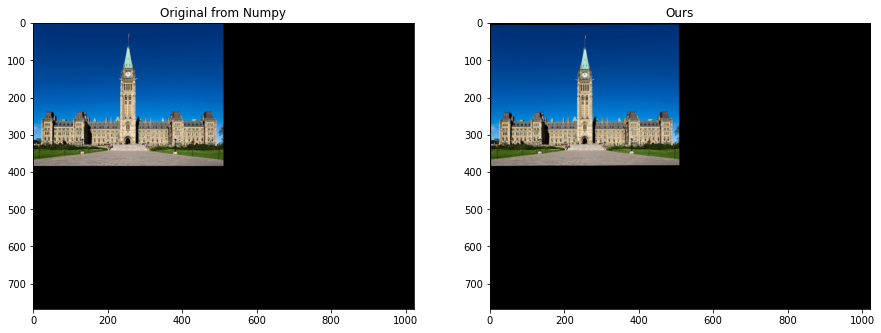

In [25]:
tran_affine = get_affine(picked_src_pts, picked_dest_pts) #getting transformation matrix 
# returning to inline
%matplotlib inline

tran_affine = tran_affine.reshape((-1,3)) #reshaping to 2 by 3 affine transformation matrix

transformed_img = cv.warpAffine(parliament, tran_affine, (parliament.shape[1], parliament.shape[0])) #Transforming image

fig = plt.figure(figsize=(15,15))
fig.add_subplot(121)
plt.imshow(tran_img[:, :, ::-1])
plt.title("Original from Numpy")
fig.add_subplot(122)
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Ours")
plt.show()


#### Finding error

In [26]:

print("absolute error: ", np.sum(np.abs(tran_affine-tran)))

absolute error:  7.286456648518936


#### Overconstrained Affine Transformation Solve

In [28]:
# Picking source points
picked_src_pts_over = pick_points_img(parliament[:, :, ::-1], 4)

Please click correspondances
clicked [(509.6725007883947, 129.31646168401141), (301.384894355093, 508.75512456638285), (721.1893724377167, 507.14049195837276), (395.0335856196783, 507.14049195837276)]


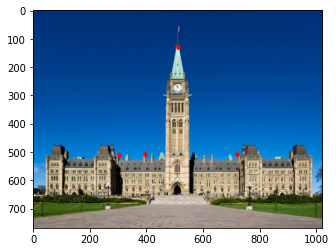

In [29]:
picked_src_pts_over = [list(x) for x in picked_src_pts_over]
picked_src_pts_over = np.asarray(picked_src_pts_over)
#print(picked_src_pts_over)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(parliament[:, :, ::-1])
plt.scatter(x = picked_src_pts_over[:, 0],y= picked_src_pts_over[:, 1], color='red', s=12)
plt.show()


In [30]:
#picking destination points
picked_dest_pts_over = pick_points_img(tran_img[:, :, ::-1], 4) 


Please click correspondances
clicked [(254.00379583266022, 64.33734453238571), (151.45493458245835, 254.548942012599), (361.514698756259, 254.548942012599), (199.42133742529472, 252.8949281214667)]


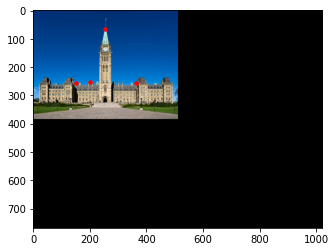

In [31]:
picked_dest_pts_over = [list(x) for x in picked_dest_pts_over] 
picked_dest_pts_over = np.asarray(picked_dest_pts_over)
#print(picked_dest_pts_over)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(tran_img[:, :, ::-1])
plt.scatter(x = picked_dest_pts_over[:, 0],y= picked_dest_pts_over[:, 1], color='red', s=12)
plt.show()


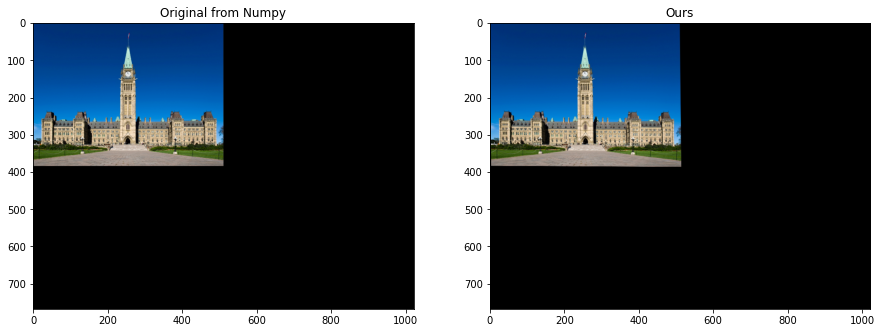

In [33]:
tran_affine = get_affine(picked_src_pts_over, picked_dest_pts_over) #getting transformation matrix 
# returning to inline
%matplotlib inline

tran_affine = tran_affine.reshape((-1,3)) #reshaping to 2 by 3 matrix
transformed_img = cv.warpAffine(parliament, tran_affine, (parliament.shape[1], parliament.shape[0])) #applying transformation

fig = plt.figure(figsize=(15, 15))
fig.add_subplot(121)
plt.imshow(tran_img[:, :, ::-1])
plt.title("Original from Numpy")
fig.add_subplot(122)
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Ours")
plt.show()


#### Finding Error

In [34]:
print("absolute error: ", np.sum(np.abs(tran_affine-tran)))

absolute error:  3.197406340884557


#### Homography Transformation Solve (4 correspondances)

In [54]:
# Picking source points
picked_src_pts_h = pick_points_img(parliament[:, :, ::-1], 4) 

Please click correspondances
clicked [(508.76426994638905, 126.08719646799125), (931.798013245033, 471.61857458215076), (521.68133081047, 505.5258593503627), (381.2082939135919, 537.8185115105646)]


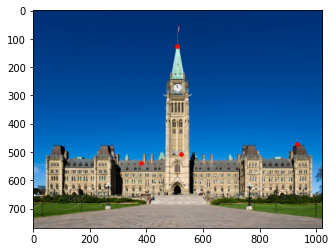

In [55]:
picked_src_pts_h = [list(x) for x in picked_src_pts_h]
picked_src_pts_h = np.float32(picked_src_pts_h) 
#print(picked_src_pts_h)

#return to inline
%matplotlib inline

#showing picked points
plt.imshow(parliament[:, :, ::-1])
plt.scatter(x = picked_src_pts_h[:, 0],y= picked_src_pts_h[:, 1], color='red', s=12)
plt.show()


In [56]:
#Picking Destination points
picked_dest_pts_h = pick_points_img(tran_img_h[:, :, ::-1], 4)


Please click correspondances
clicked [(260.4542502479443, 64.1695460216913), (953.3422433374925, 730.8490098218), (393.13492977573014, 467.1256838468184), (332.5277057939021, 454.0214192020988)]


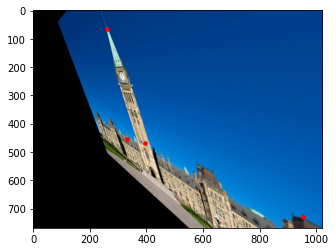

In [57]:
picked_dest_pts_h = [list(x) for x in picked_dest_pts_h]
picked_dest_pts_h = np.float32(picked_dest_pts_h)
#print(picked_dest_pts_h)

#return to inline
%matplotlib inline
#showing picked points
plt.imshow(tran_img_h[:, :, ::-1])
plt.scatter(x = picked_dest_pts_h[:, 0],y= picked_dest_pts_h[:, 1], color='red', s=12)
plt.show()



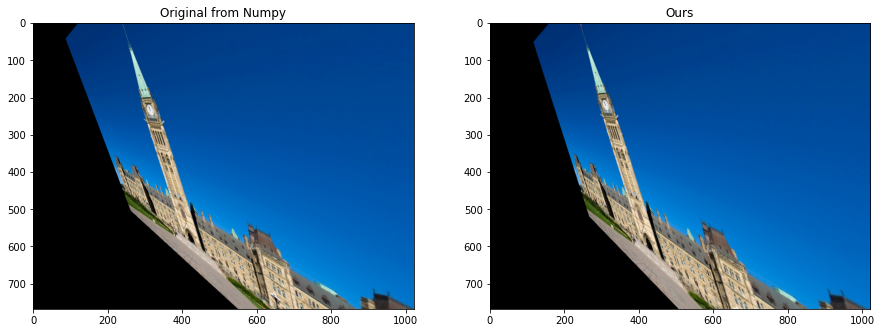

In [59]:
tran_homography = get_homography(picked_src_pts_h, picked_dest_pts_h) #solving homography matrix
tran_homography = np.append(tran_homography, 1.) 
tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
transformed_img = cv.warpPerspective(parliament, tran_homography, (parliament.shape[1], parliament.shape[0])) #Applying transformation
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(121)
plt.imshow(tran_img_h[:, :, ::-1])
plt.title("Original from Numpy")
fig.add_subplot(122)
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Ours")
plt.show()

#### Finding Error

In [60]:
print("absolute error: ", np.sum(np.abs(tran_homography-tran_h)))

absolute error:  38.32576263309561


#### Overconstrained Homography Transformation Solve  (8 correspondances)

In [62]:
# Picking source points
picked_src_pts_h_over = pick_points_img(parliament[:, :, ::-1], 8) 

Please click correspondances
clicked [(508.76702070717135, 127.30520775390687), (929.5182722683429, 473.901066319623), (784.4316337989734, 475.5131400803938), (758.6384536266411, 473.901066319623), (602.2672988318762, 507.75461529580923), (520.0515370325669, 501.30632025272615), (394.30978369244656, 507.75461529580923), (331.4389070223865, 507.75461529580923)]


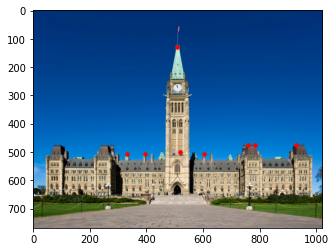

In [63]:

picked_src_pts_h_over = [list(x) for x in picked_src_pts_h_over]
picked_src_pts_h_over = np.float32(picked_src_pts_h_over)
#print(picked_src_pts_h_over)

# Return to inline 
%matplotlib inline

#showing picked src points
plt.imshow(parliament[:, :, ::-1])
plt.scatter(x = picked_src_pts_h_over[:, 0],y= picked_src_pts_h_over[:, 1], color='red', s=12)
plt.show()

In [64]:
# Picking destination points 
picked_dest_pts_h_over = pick_points_img(tran_img_h[:, :, ::-1], 8)


Please click correspondances
clicked [(258.653776723586, 61.21018356230513), (951.8454938550183, 731.8328680429466), (635.8790367439467, 569.0134182050986), (600.4134140069898, 551.2806068366201), (450.490554255308, 502.91839401349694), (394.06797262833095, 467.4527712765399), (329.58502219749994, 431.9871485395829), (305.40391578593835, 420.7026322141875)]


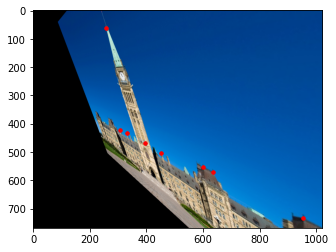

In [65]:

picked_dest_pts_h_over = [list(x) for x in picked_dest_pts_h_over]
picked_dest_pts_h_over = np.float32(picked_dest_pts_h_over)
#print(picked_dest_pts_h_over)



#return to inline
%matplotlib inline 
#showing picked points
plt.imshow(tran_img_h[:, :, ::-1])
plt.scatter(x = picked_dest_pts_h_over[:, 0],y= picked_dest_pts_h_over[:, 1], color='red', s=12)
plt.show()

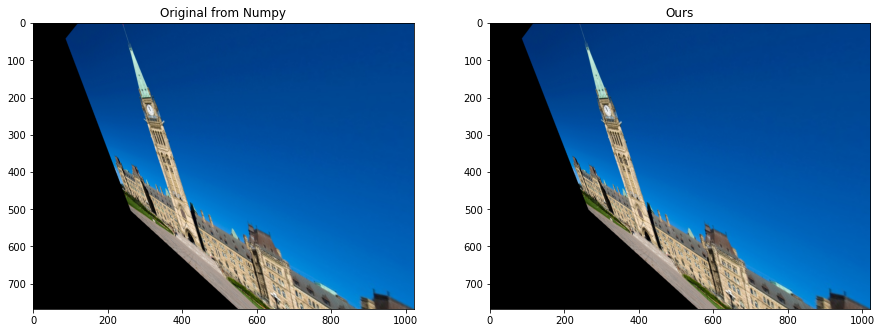

In [69]:
tran_homography = get_homography(picked_src_pts_h_over, picked_dest_pts_h_over) #solve transformation matrix 
tran_homography = np.append(tran_homography, 1.) 

# Return to inline 
%matplotlib inline

tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
transformed_img = cv.warpPerspective(parliament, tran_homography, (parliament.shape[1], parliament.shape[0])) # apply transformation
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(121)
plt.imshow(tran_img_h[:, :, ::-1])
plt.title("Original from Numpy")
fig.add_subplot(122)
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Ours")
plt.show()

#### Finding Error 

In [67]:
print("absolute error: ", np.sum(np.abs(tran_homography-tran_h)))

absolute error:  1.9905315872163647


# Image processing 
## Filtering 

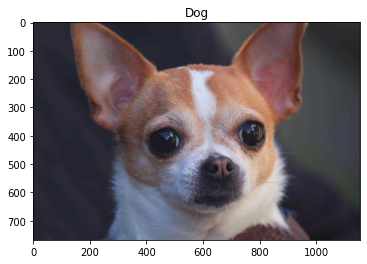

In [3]:
# load image to be used
img = cv.imread("dog.jpg")
plt.title("Dog")
plt.imshow(img[:, :, ::-1])
plt.show()

In [4]:
def convolve_col_img(img, kernel): 
    '''
    Do cross corellation over color image with 2D kernel
    img: img to be filtered over
    kernel: filter to apply to image 
    Returns: convolved image with 3 channels
    In order to run this function, you should pass in a low resolution image in order to only take minutes
    '''
    assert len(kernel.shape) == 2
    #plt.imshow(img)
    #plt.show()
    
    #Apply symmetric border padding to all channels of image to prevent out of bounds during convolutions 
    assert img.shape[2] == 3 # only be run on 3 channel color images
    red, green, blue = cv.split(img)
    print(img.shape[0], img.shape[1])
    k_width = kernel.shape[1]//2 # kernel width
    k_height = kernel.shape[0]//2 # kernel height 
    
    #Applying padding to channels using numpy builtin function pad
    red = np.pad(red,((k_height, k_height), (k_width, k_width) ),mode='symmetric' )
    green = np.pad(green,( (k_height, k_height), (k_width, k_width)), mode='symmetric' )
    blue = np.pad(blue,((k_height, k_height), (k_width, k_width)), mode='symmetric' )
    img = cv.merge((red, green, blue)) # merge channels
    print(img.shape[0], img.shape[1]) 
    
    # cross correlation algorithm 
    conv_img = np.zeros_like(img)
    for c in range(img.shape[2]): #iterating over 3 channels
      for i in range(k_height, img.shape[0]-k_height): 
          for j in range(k_width, img.shape[1]-k_width):
            sum_i = 0 # to track weighted sums of each 'window'
            for u in range(kernel.shape[0]): 
                for v in range(kernel.shape[1]):
                    sum_i += (kernel[u, v]*img[i+u-k_width,j+v-k_width, c])
            conv_img[i, j, c] = sum_i
    assert (conv_img.shape[2] == 3)
    #returning trimmed convolved image without padding
    return conv_img[k_height:conv_img.shape[0]-k_height, k_width:conv_img.shape[1]-k_width, : ] 


def reduce_img(img): 
  '''
  Reduce image by a quarter of its scale (half of width, half of height) 
  and gaussian blur image for gaussian and laplacian pyramid 
  img: image to be reduced
  Returns: reduced image with quarter the dimensions (half of width, half of height)
  '''
  
  # running separable gaussian filtering on it using method opencv from: https://en.wikipedia.org/wiki/Separable_filter
  separable_gauss_kernelx = np.array([1, 2, 1])/4
  separable_gauss_kernely = np.array([1, 2, 1])/4
  img = cv.sepFilter2D(img, -1, separable_gauss_kernelx ,separable_gauss_kernely, 0) #separable 2d filtering 
  new_height = img.shape[0]//2
  new_width = img.shape[1]//2
  # if image is 2-D
  if len(img.shape) == 2: 
    img = img.copy().reshape((-1, img.shape[1], 1)) # reshape to (rows, cols, 1)
    
  new_img = np.zeros_like(img,dtype='uint8')
  
  # dropping every other row
  for c in range(img.shape[2]): #iterating across channels of image
    ind = 0
    #iterating across rows of original image
    for i in range(img.shape[0]):
      if i%2 == 0: 
        new_img[ind, :, c] = img[i, :, c]
        ind +=1

 # dropping every other column of new image
  for c in range(new_img.shape[2]): #iterating across channels of image
    ind = 0
    #iterating across rows of image
    for i in range(new_img.shape[1]):
      if i%2 == 0: 
        new_img[:, ind, c] = new_img[:, i, c]
        ind +=1
  
  return new_img[:new_height, :new_width, :]

def expand_img(img): 
  '''
  Expand image by twice its scale (double of width, double of height) 
  img: image to be reduced
  Returns: expanded image twice its scale (double of width, double of height)
  '''
  assert len(img.shape) == 2 or len(img.shape) == 3
  # If image is 2-D
  if len(img.shape) == 2: 
    img = img.copy().reshape((-1, img.shape[1], 1))

  new_height = img.shape[0]*2
  new_width = img.shape[1]*2 
  new_img_channels = img.shape[2]
  temp_img = np.zeros((new_height, new_width, new_img_channels),dtype='uint8')
  new_img = np.zeros((new_height, new_width, new_img_channels), dtype='uint8')
  
  # dropping every other row
  for c in range(img.shape[2]): #iterating across channels of image
    ind = 0
    #iterating across rows of original image
    for i in range(img.shape[0]):
      temp_img[ind, :img.shape[1], c] = img[i, :, c]
      temp_img[ind+1, :img.shape[1], c] = img[i, :, c]
      ind +=2 
  


 # dropping every other column of new image
  for c in range(new_img.shape[2]): #iterating across channels of image
    ind_c = 0
    #iterating across rows of image
    for i in range(img.shape[1]):
      new_img[:, ind_c, c] = temp_img[:, i, c]
      new_img[:, ind_c+1, c] = temp_img[:, i, c]
      ind_c +=2
  return new_img

def laplacian_pyramid(img, num_of_times): 
  '''
  Creates gaussian and laplacian pyramid using reduce and expand functions
  img: Image to be used
  num_of_times: Number of images in laplacian pyramid
  Dimensions of image might be odd therefore expanded image might be off by 1 in dimensions 
  ie. if orig_img.shape = (577, 577, 3) expanded image dimensions will be one less
  ie. expanded_img.shape = (576, 576, 3). This happens even with OpenCV pyrup() and pyrdown() functions for reduce and expand
  Solution: I crop original image to match expanded image
  '''
  gaussian_pyr = [] 
  
  mod_img = img.copy() #Creating copy of original image 
  gaussian_pyr.append(mod_img)

  #Creating gaussian pyramid 
  for i in range(num_of_times): 
    mod_img = reduce_img(mod_img)
    gaussian_pyr.append(mod_img)
  laplacian_pyr = [gaussian_pyr[-1]] # first image in laplacian pyramid is last downsampled image in gaussian pyramid


  #Creating laplacian pyramid 
  for i in reversed(range(0, num_of_times)): 
    
    gaus_img = gaussian_pyr[i]
    mod_img = expand_img(gaussian_pyr[i+1])
    #cropping to match expanded image
    gaus_img = gaus_img[:mod_img.shape[0], :mod_img.shape[1], :]
    laplacian_pyr.append(np.subtract(gaus_img,  mod_img)) # computing laplacian pyramid using formula from class notes

  return gaussian_pyr, laplacian_pyr

def decode_pyramid(laplacian_pyr): 
  '''
  Decodes gaussian and laplacian pyramid
  laplacian_pyr: Laplacian pyramid to be collapsed
  '''
  # assert laplacian_pyr is of type list
  assert isinstance(laplacian_pyr, list)
  laplacian_pyr_rev = laplacian_pyr[::-1] #reverse laplacian_pyramid
  gaus_img = laplacian_pyr_rev[-1]

  def restore_img(img_, i): 
    '''
    Recursively defined function for restoring image from laplacian & gaussian pyramid 
    img: image to be passed in 
    i: index of laplacian pyramid, stopping condition
    '''
    #print(img_.shape)
    if (i == 0 ): # stopping condition
      return img_
    laplacian_img = laplacian_pyr_rev[i-1] 
    gaus_img = expand_img(img_)
    # Here I crop image from pyramid for the same reason as before
    # due to flooring of odd numbers expanded image may have one or so less rows
    return restore_img(laplacian_img[:gaus_img.shape[0], :gaus_img.shape[1], :] + gaus_img, i-1)

  return restore_img(gaus_img, len(gaussian_pyr)-1)
def image_stitch(img1, img2, boundary_pos, num_of_times): 
  '''
  to stitch two images at a given boundary using pyramids
  img1, img2: images to stitch together. Must have same number of rows(dimension of axis 0)
  boundary_pos: left boundary of img2 at which to stich images together. Must be 1 dimensional with length 
  equaling number of columns of image
  num_of_times: Number of images in laplacian pyramid to use. Higher num_of_times makes the stitch more realistic
  '''
  assert img1.shape[0] == img2.shape[0] 
  assert img1.shape[2] == img2.shape[2]
  ga_img1, la_img1 = laplacian_pyramid(img1, num_of_times) #generating laplacian and gaussian pyramid
  ga_img2, la_img2 = laplacian_pyramid(img2, num_of_times)
  relative_bound = boundary_pos/img1.shape[1] # relative bound for multiscale cropping 
  #print(relative_bound)

  la_comb = [] #to store combined laplacian pyramid images
  
  #for every laplacian level create a new laplacian image with combined images
  for la, lb in zip(la_img1, la_img2): 
    rows, cols, dpt  = la.shape
    #print(la[:, :cols//2, :].shape, lb[:, :cols//2, :].shape)
    mod_img = np.hstack((la[:, :int(cols*relative_bound), :], lb[:, int(cols*relative_bound):, :]) ) 
    la_comb.append(mod_img)
  
  #Generating gaussian pyramid 
  mod_la = la_comb[0] # modified laplacian
  print(mod_la.shape)
  for i in range(1, num_of_times+1): # iterating from 2nd image to last image 
    mod_la = expand_img(mod_la)
    # cropping combined laplacian image for same reasons as above
    mod_la = mod_la + la_comb[i][:mod_la.shape[0], :mod_la.shape[1], :]
  return mod_la 

#### Testing convolution 

61 92
63 94
61 92
63 94
61 92
63 94


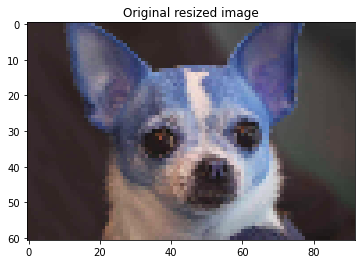

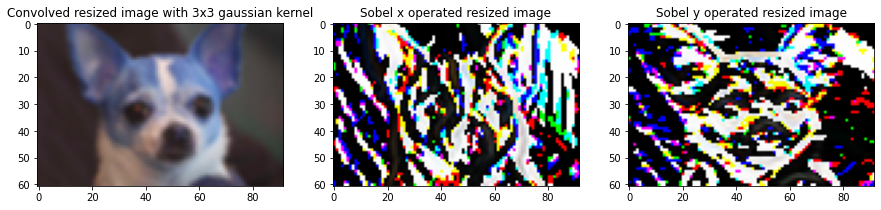

In [5]:

resized_img = cv.resize(img, (0, 0), fx=0.08, fy=0.08) # scale by .08 factor to reduce computation time 

plt.imshow(resized_img[:, :, ::-1])
gaus_blur = np.array([[1,2, 1], [2, 4, 2], [1, 2, 1]])/16 #gaussian blur kernel, normalized
sobelx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])/8 # sobel operator x
sobely = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])/8 # sobel operator y

conv_resized_img = convolve_col_img(resized_img, gaus_blur) # filtering image (cross-correllation)
sobelx_resized_img = convolve_col_img(resized_img, sobelx) # applying sobel operator 
sobely_resized_img = convolve_col_img(resized_img, sobely) 

plt.imshow(resized_img)
plt.title("Original resized image")
plt.show()

fig = plt.figure(figsize=(15, 15))
fig.add_subplot(131)
plt.imshow(conv_resized_img)
plt.title("Convolved resized image with 3x3 gaussian kernel")

fig.add_subplot(132)
plt.imshow(sobelx_resized_img)
plt.title("Sobel x operated resized image")

fig.add_subplot(133)
plt.imshow(sobely_resized_img)
plt.title("Sobel y operated resized image")
plt.show()


#### Testing reducing and expanding images

original image shape: (768, 1154, 3) reduced image shape: (384, 577, 3)


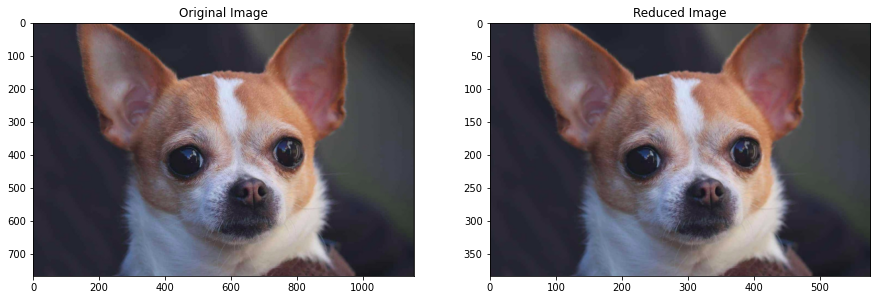

original image shape: (768, 1154, 3) expanded image shape: (1536, 2308, 3)


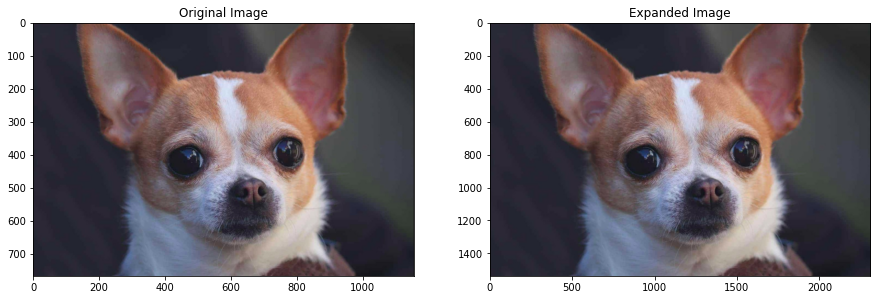

In [6]:

#testing reducing image by factor of four
reduced_img = reduce_img(img)
print("original image shape:", img.shape,"reduced image shape:", reduced_img.shape)
fig = plt.figure(figsize=(15,15))

#plotting original image
fig.add_subplot(121)
plt.imshow(img[:, :, ::-1])
plt.title("Original Image")


# plotting reduced image
fig.add_subplot(122)
plt.imshow(reduced_img[:, :, ::-1])
plt.title("Reduced Image")
plt.show()

#testing expanding image by factor of two 
expanded_img = expand_img(img)
print("original image shape:", img.shape,"expanded image shape:", expanded_img.shape)

fig = plt.figure(figsize=(15,15))
#plotting original image
fig.add_subplot(121)
plt.imshow(img[:, :, ::-1])
plt.title("Original Image")


# plotting expanded image
fig.add_subplot(122)
plt.imshow(expanded_img[:, :, ::-1])
plt.title("Expanded Image")
plt.show()


#### Creating Pyramids

5 5


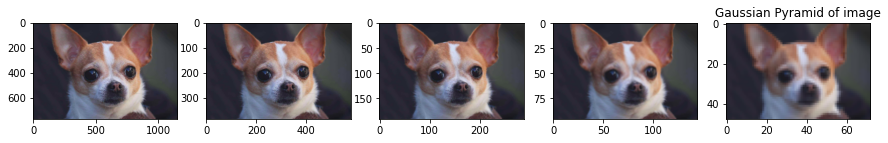

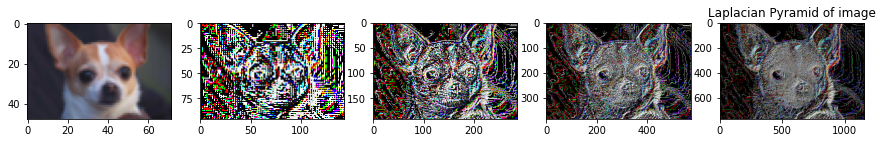

In [7]:
gaussian_pyr, laplacian_pyr = laplacian_pyramid(img,4) # Generating gaussian and laplacian pyramids

print(len(gaussian_pyr), len(laplacian_pyr)) # need to be the same 

#plotting gaussian pyramid

fig = plt.figure(figsize=(15, 15))
for i, gaus in enumerate(gaussian_pyr):
  fig.add_subplot(1, len(gaussian_pyr), i+1)
  plt.imshow(gaus[:, :, ::-1])
plt.title("Gaussian Pyramid of image")
plt.show()

#plotting laplacian pyramid
fig = plt.figure(figsize=(15, 15))
for i, lap in enumerate(laplacian_pyr):
  fig.add_subplot(1, len(laplacian_pyr), i+1)
  plt.imshow(lap[:, :, ::-1])
plt.title("Laplacian Pyramid of image")
plt.show()



## Decoding Gaussian Pyramid


original image shape: (768, 1154, 3) decoded image shape: (768, 1152, 3)


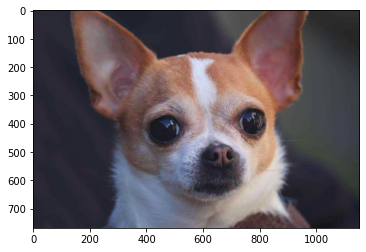

In [8]:
decoded_img = decode_pyramid(laplacian_pyr)
plt.imshow(decoded_img[:, :, ::-1])
print("original image shape:", img.shape, "decoded image shape:", decoded_img.shape)

#### Computing error with original image

In [9]:
np.sum(np.abs(np.subtract(img[:decoded_img.shape[0], :decoded_img.shape[1], :],decoded_img,dtype='float'))) #absolute error, I crop original image to match expanded image

0.0

# Image Stitching and Mosaics

## No Unwrapping

#### Loading Images

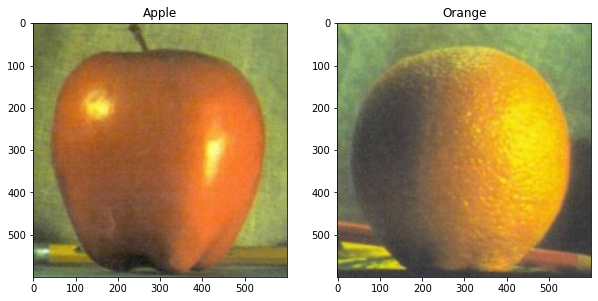

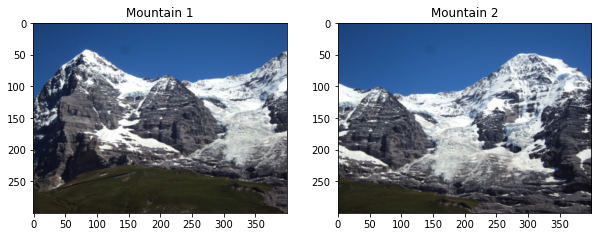

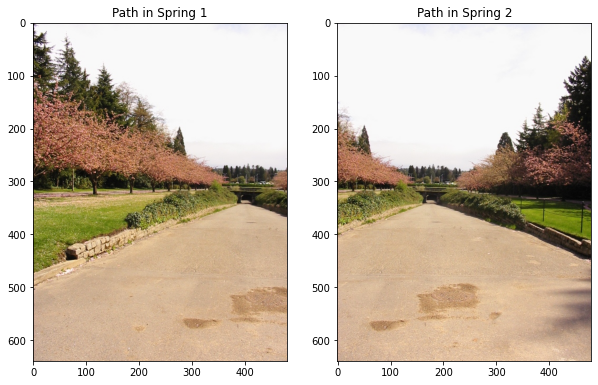

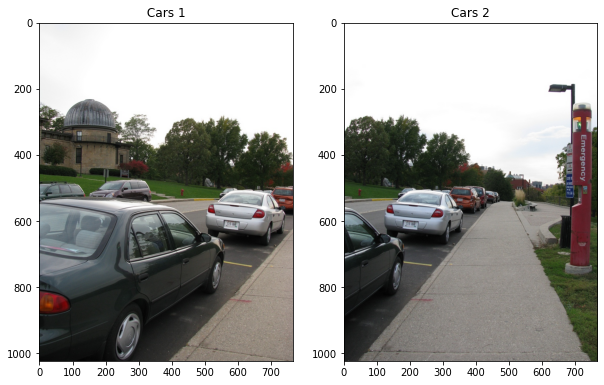

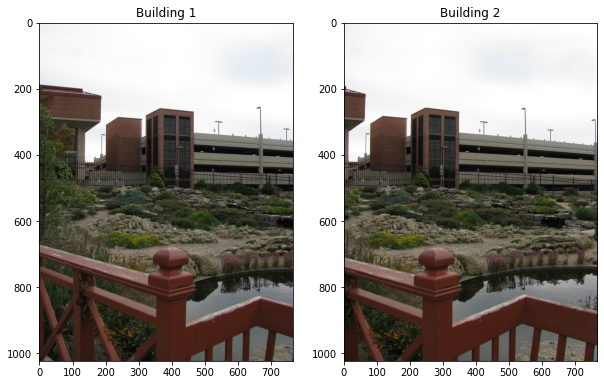

In [122]:
# Apple - Orange (not used in unwrapping examples)
apple_img = cv.imread("apple.jpg")
orange_img = cv.imread("orange.jpg")
fig = plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.title("Apple")
plt.imshow(apple_img[:, :, ::-1])
fig.add_subplot(122)
plt.title("Orange")
plt.imshow(orange_img[:, :, ::-1])
plt.show()

# Mountain
mt1 = cv.imread("mt_1.JPG")
mt2 = cv.imread("mt_2.JPG")
fig = plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(mt1[:, :, ::-1])
plt.title("Mountain 1")
fig.add_subplot(122)
plt.imshow(mt2[:, :, ::-1])
plt.title("Mountain 2")
plt.show()

# Path
path1 = cv.imread("path1.jpeg")
path2 = cv.imread("path2.jpeg")
fig = plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(path1[:, :, ::-1])
plt.title("Path in Spring 1")
fig.add_subplot(122)
plt.imshow(path2[:, :, ::-1])
plt.title("Path in Spring 2")
plt.show()


# Cars
cars1 = cv.imread("cars1.jpeg")
cars2 = cv.imread("cars2.jpeg")
fig = plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(cars1[:, :, ::-1])
plt.title(" Cars 1 ")
fig.add_subplot(122)
plt.imshow(cars2[:, :, ::-1])
plt.title("Cars 2")
plt.show()


# Buildings
building1 = cv.imread("building1.jpeg")
building2 = cv.imread("building2.jpeg")
fig = plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(building1[:, :, ::-1])
plt.title("Building 1")
fig.add_subplot(122)
plt.imshow(building2[:, :, ::-1])
plt.title("Building 2")
plt.show()

### No Unwrapping
#### Apple - Orange

In [73]:
# Picking boundary
picked_boundary_pt = pick_points_img(orange_img[:, :, ::-1], 1) #pick one point

Please click correspondances
clicked [(223.8929359823399, 215.94591611479035)]


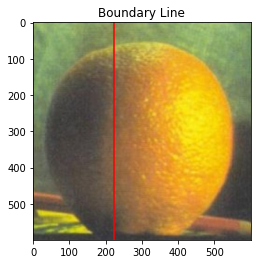

(36, 36, 3) (36, 36, 3)
(74, 74, 3) (74, 74, 3)
(150, 150, 3) (150, 150, 3)
(300, 300, 3) (300, 300, 3)
(600, 600, 3) (600, 600, 3)
(36, 36, 3) (36, 36, 3)
(74, 74, 3) (74, 74, 3)
(150, 150, 3) (150, 150, 3)
(300, 300, 3) (300, 300, 3)
(600, 600, 3) (600, 600, 3)
0.37315489330389984
6
(18, 18, 3)
(36, 36, 3) (36, 36, 3)
(74, 74, 3) (72, 72, 3)
(150, 150, 3) (144, 144, 3)
(300, 300, 3) (288, 288, 3)
(600, 600, 3) (576, 576, 3)


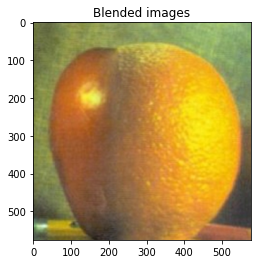

In [74]:
picked_boundary_pt = np.asarray(picked_boundary_pt[0])
#return to inline
%matplotlib inline
# print picked boundary vertical line 
plt.imshow(orange_img[:, :, ::-1])
plt.axvline(x=picked_boundary_pt[0], color='r')
plt.title("Boundary Line")
plt.show()
comb_img = image_stitch(apple_img, orange_img, picked_boundary_pt[0], 5 )  #passing in x coordinate corresponding to columns
plt.imshow(comb_img[:, :, ::-1])
plt.title("Blended images")
plt.show()

#### Mountains

In [168]:
picked_boundary_pt = pick_points_img(mt2[:, :, ::-1], 1) #pick one point

Please click correspondances
clicked [(218.85016556291401, 143.59492273730686)]


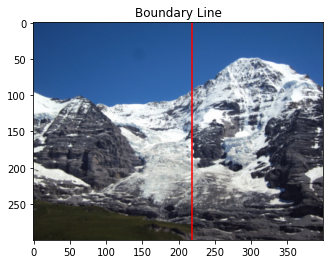

(74, 100, 3) (74, 100, 3)
(150, 200, 3) (150, 200, 3)
(300, 400, 3) (300, 400, 3)
(74, 100, 3) (74, 100, 3)
(150, 200, 3) (150, 200, 3)
(300, 400, 3) (300, 400, 3)
0.5471254139072851
4
(37, 50, 3)
(74, 100, 3) (74, 100, 3)
(150, 200, 3) (148, 200, 3)
(300, 400, 3) (296, 400, 3)


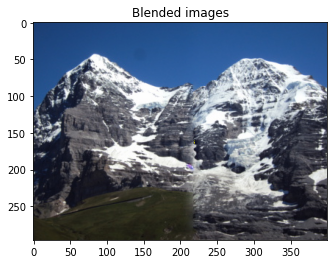

In [172]:
picked_boundary_pt = np.asarray(picked_boundary_pt[0])
#return to inline
%matplotlib inline
# print picked boundary vertical line 
plt.imshow(mt2[:, :, ::-1])
plt.axvline(x=picked_boundary_pt[0], color='r')
plt.title("Boundary Line")
plt.show()
comb_img = image_stitch(mt1, mt2, picked_boundary_pt[0], 3 )  #passing in x coordinate corresponding to columns
plt.imshow(comb_img[:, :, ::-1])
plt.title("Blended images")
plt.show()

#### Path

In [178]:
picked_boundary_pt = pick_points_img(path2[:, :, ::-1], 1) #pick one point

Please click correspondances
clicked [(250.0960264900662, 306.90250183958796)]


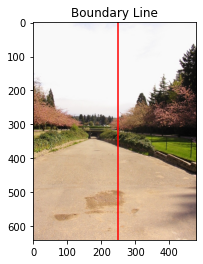

(80, 60, 3) (80, 60, 3)
(160, 120, 3) (160, 120, 3)
(320, 240, 3) (320, 240, 3)
(640, 480, 3) (640, 480, 3)
(80, 60, 3) (80, 60, 3)
(160, 120, 3) (160, 120, 3)
(320, 240, 3) (320, 240, 3)
(640, 480, 3) (640, 480, 3)
0.5210333885209713
5
(40, 30, 3)
(80, 60, 3) (80, 60, 3)
(160, 120, 3) (160, 120, 3)
(320, 240, 3) (320, 240, 3)
(640, 480, 3) (640, 480, 3)


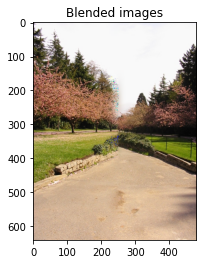

In [179]:
picked_boundary_pt = np.asarray(picked_boundary_pt[0])
#return to inline
%matplotlib inline
# print picked boundary vertical line 
plt.imshow(path2[:, :, ::-1])
plt.axvline(x=picked_boundary_pt[0], color='r')
plt.title("Boundary Line")
plt.show()
comb_img = image_stitch(path1, path2, picked_boundary_pt[0], 4 )  #passing in x coordinate corresponding to columns
plt.imshow(comb_img[:, :, ::-1])
plt.title("Blended images")
plt.show()

#### Cars

In [180]:
picked_boundary_pt = pick_points_img(cars2[:, :, ::-1], 1) #pick one point

Please click correspondances
clicked [(301.55739514348795, 590.2402501839588)]


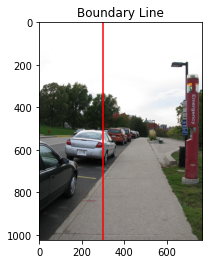

(128, 96, 3) (128, 96, 3)
(256, 192, 3) (256, 192, 3)
(512, 384, 3) (512, 384, 3)
(1024, 768, 3) (1024, 768, 3)
(128, 96, 3) (128, 96, 3)
(256, 192, 3) (256, 192, 3)
(512, 384, 3) (512, 384, 3)
(1024, 768, 3) (1024, 768, 3)
0.39265285825974994
5
(64, 48, 3)
(128, 96, 3) (128, 96, 3)
(256, 192, 3) (256, 192, 3)
(512, 384, 3) (512, 384, 3)
(1024, 768, 3) (1024, 768, 3)


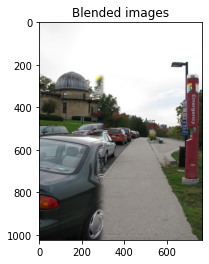

In [181]:
picked_boundary_pt = np.asarray(picked_boundary_pt[0])
#return to inline
%matplotlib inline
# print picked boundary vertical line 
plt.imshow(cars2[:, :, ::-1])
plt.axvline(x=picked_boundary_pt[0], color='r')
plt.title("Boundary Line")
plt.show()
comb_img = image_stitch(cars1, cars2, picked_boundary_pt[0], 4 )  #passing in x coordinate corresponding to columns
plt.imshow(comb_img[:, :, ::-1])
plt.title("Blended images")
plt.show()

#### Buildings

In [182]:
picked_boundary_pt = pick_points_img(building2[:, :, ::-1], 1) #pick one point

Please click correspondances
clicked [(278.0106696100074, 552.5654893303899)]


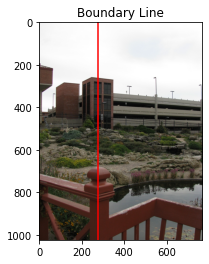

(128, 96, 3) (128, 96, 3)
(256, 192, 3) (256, 192, 3)
(512, 384, 3) (512, 384, 3)
(1024, 768, 3) (1024, 768, 3)
(128, 96, 3) (128, 96, 3)
(256, 192, 3) (256, 192, 3)
(512, 384, 3) (512, 384, 3)
(1024, 768, 3) (1024, 768, 3)
0.3619930593880305
5
(64, 48, 3)
(128, 96, 3) (128, 96, 3)
(256, 192, 3) (256, 192, 3)
(512, 384, 3) (512, 384, 3)
(1024, 768, 3) (1024, 768, 3)


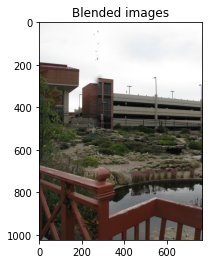

In [183]:
picked_boundary_pt = np.asarray(picked_boundary_pt[0])
#return to inline
%matplotlib inline
# print picked boundary vertical line 
plt.imshow(building2[:, :, ::-1])
plt.axvline(x=picked_boundary_pt[0], color='r')
plt.title("Boundary Line")
plt.show()
comb_img = image_stitch(building1, building2, picked_boundary_pt[0], 4 )  #passing in x coordinate corresponding to columns
plt.imshow(comb_img[:, :, ::-1])
plt.title("Blended images")
plt.show()

## Affine Transformation Mosaic Unwrapping
Note: The reason I don't write it as a function, is that my function for picking points has to be run in its own cell. 

#### Mountains

In [190]:
# assigning temporary variable to image
temp_img1 = mt1
temp_img2 = mt2

In [91]:
picked_src_pts = pick_points_img(temp_img2[:, :, ::-1], 3)


Please click correspondances
clicked [(63.68593423662638, 101.06064692855867), (89.5043030614708, 231.4119236783829), (228.6716081905102, 199.29639172552763)]


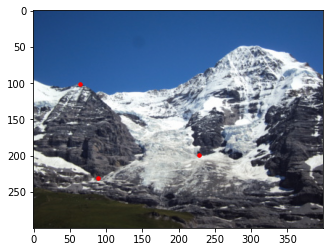

In [92]:
picked_src_pts = [list(x) for x in picked_src_pts]
picked_src_pts = np.asarray(picked_src_pts)
#print(picked_src_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts[:, 0],y= picked_src_pts[:, 1], color='red', s=12)
plt.show()


In [93]:
picked_corr_pts = pick_points_img(temp_img1[:, :, ::-1], 3) #Picking correspondences from other image


Please click correspondances
clicked [(213.61935411861006, 83.84301021547094), (241.04486409490502, 208.21450894518085), (381.3614267643213, 169.94635548988552)]


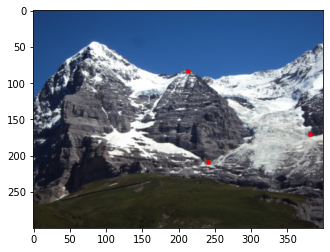

In [94]:
picked_corr_pts = [list(x) for x in picked_corr_pts]
picked_corr_pts = np.asarray(picked_corr_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts[:, 0],y= picked_corr_pts[:, 1], color='red', s=12)
plt.show()


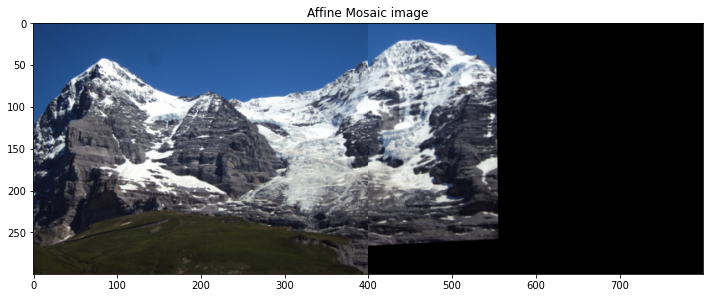

In [191]:
tran_affine = get_affine(picked_src_pts, picked_corr_pts)
%matplotlib inline
tran_affine = tran_affine.reshape((-1,3)) #reshaping to 2 by 3 matrix
transformed_img = cv.warpAffine(temp_img2, tran_affine, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))
transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Affine Mosaic image")
plt.show()

#### Path

In [192]:
temp_img1 = path1
temp_img2 = path2

In [205]:
picked_src_pts = pick_points_img(temp_img2[:, :, ::-1], 3)


Please click correspondances
clicked [(169.73998637167017, 337.9732011669257), (137.0319946338451, 267.10588573497154), (47.08501735482639, 188.0615723685611)]


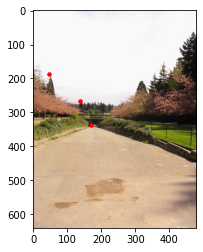

In [206]:
picked_src_pts = [list(x) for x in picked_src_pts]
picked_src_pts = np.asarray(picked_src_pts)
#print(picked_src_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts[:, 0],y= picked_src_pts[:, 1], color='red', s=12)
plt.show()


In [207]:
picked_corr_pts = pick_points_img(temp_img1[:, :, ::-1], 3) #Picking correspondences from other image


Please click correspondances
clicked [(390.7456638284451, 335.0744770314306), (360.4713024282561, 264.4343004309891), (273.01203616104283, 192.11221486387035)]


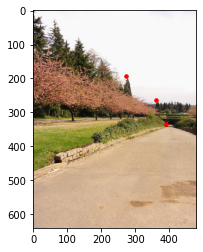

In [208]:
picked_corr_pts = [list(x) for x in picked_corr_pts]
picked_corr_pts = np.asarray(picked_corr_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts[:, 0],y= picked_corr_pts[:, 1], color='red', s=12)
plt.show()


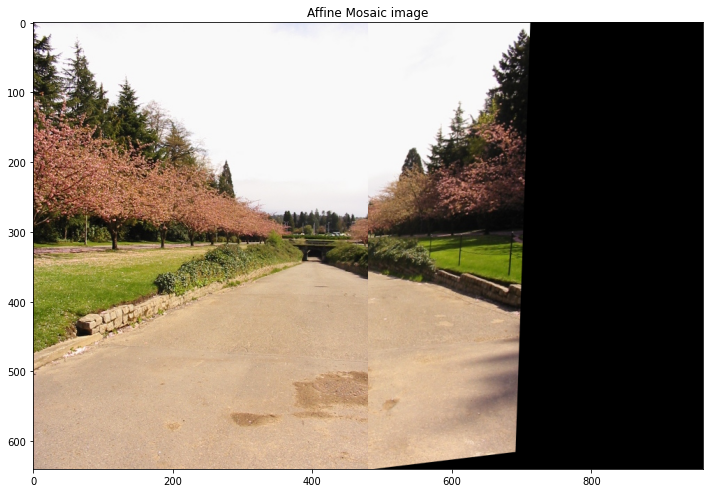

In [209]:
tran_affine = get_affine(picked_src_pts, picked_corr_pts)
%matplotlib inline
tran_affine = tran_affine.reshape((-1,3)) #reshaping to 2 by 3 matrix
transformed_img = cv.warpAffine(temp_img2, tran_affine, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))
transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Affine Mosaic image")
plt.show()

#### Cars

In [210]:
temp_img1 = cars1
temp_img2 = cars2

In [212]:
picked_src_pts = pick_points_img(temp_img2[:, :, ::-1], 3)


Please click correspondances
clicked [(306.9525978932395, 658.2571003155696), (277.3690608471486, 555.8525490021779), (140.82965909595964, 544.4742655229121)]


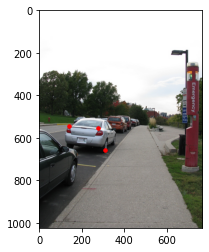

In [213]:
picked_src_pts = [list(x) for x in picked_src_pts]
picked_src_pts = np.asarray(picked_src_pts)
#print(picked_src_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts[:, 0],y= picked_src_pts[:, 1], color='red', s=12)
plt.show()


In [214]:
picked_corr_pts = pick_points_img(temp_img1[:, :, ::-1], 3) #Picking correspondences from other image


Please click correspondances
clicked [(694.4958963486952, 668.5750936703014), (657.9555577712242, 561.1035096189166), (522.5413618664793, 543.908056170695)]


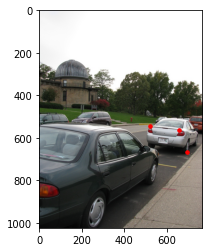

In [215]:
picked_corr_pts = [list(x) for x in picked_corr_pts]
picked_corr_pts = np.asarray(picked_corr_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts[:, 0],y= picked_corr_pts[:, 1], color='red', s=12)
plt.show()


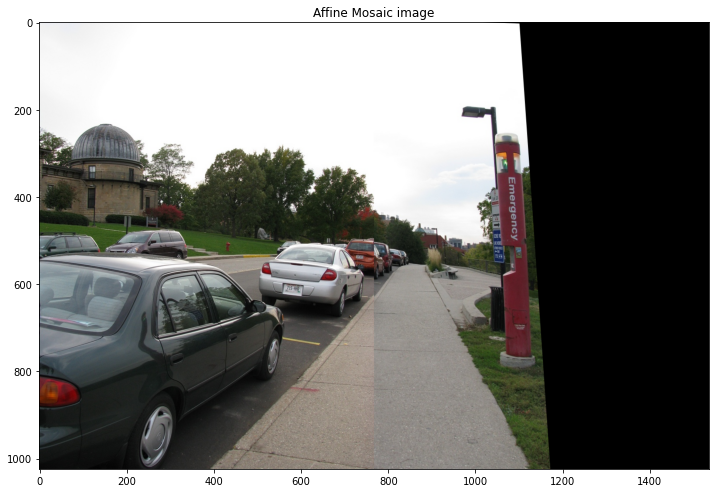

In [216]:
tran_affine = get_affine(picked_src_pts, picked_corr_pts)
%matplotlib inline
tran_affine = tran_affine.reshape((-1,3)) #reshaping to 2 by 3 matrix
transformed_img = cv.warpAffine(temp_img2, tran_affine, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))
transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Affine Mosaic image")
plt.show()

#### Buildings

In [217]:
temp_img1 = building1
temp_img2 = building2

In [230]:
picked_src_pts = pick_points_img(temp_img2[:, :, ::-1], 3)


Please click correspondances
clicked [(247.46720277514964, 260.85519814990005), (411.0833070535057, 381.4144328813203), (529.4896983075789, 402.9428676547882)]


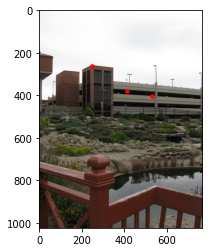

In [231]:
picked_src_pts = [list(x) for x in picked_src_pts]
picked_src_pts = np.asarray(picked_src_pts)
#print(picked_src_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts[:, 0],y= picked_src_pts[:, 1], color='red', s=12)
plt.show()


In [232]:
picked_corr_pts = pick_points_img(temp_img1[:, :, ::-1], 3) #Picking correspondences from other image


Please click correspondances
clicked [(365.34706458550727, 259.76839292178613), (531.067556057154, 381.87822874299945), (650.9968590958456, 401.5030237856945)]


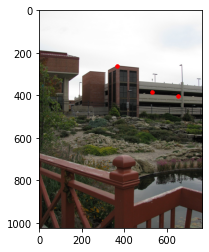

In [233]:
picked_corr_pts = [list(x) for x in picked_corr_pts]
picked_corr_pts = np.asarray(picked_corr_pts)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts[:, 0],y= picked_corr_pts[:, 1], color='red', s=12)
plt.show()


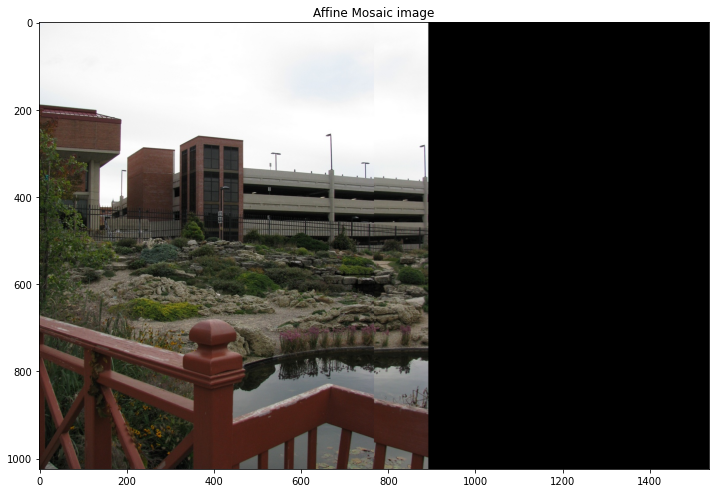

In [234]:
tran_affine = get_affine(picked_src_pts, picked_corr_pts)
%matplotlib inline
tran_affine = tran_affine.reshape((-1,3)) #reshaping to 2 by 3 matrix
transformed_img = cv.warpAffine(temp_img2, tran_affine, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))
transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Affine Mosaic image")
plt.show()

## Projective Transformation Mosaic

#### Mountains

In [235]:
temp_img1 = mt1
temp_img2 = mt2

In [114]:
picked_src_pts_h = pick_points_img(temp_img2[:, :, ::-1], 4)


Please click correspondances
clicked []


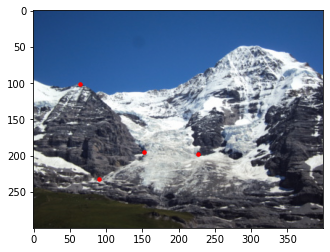

In [109]:
picked_src_pts_h = [list(x) for x in picked_src_pts_h]
picked_src_pts_h = np.float32(picked_src_pts_h)
#print(picked_src_pts_h)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts_h[:, 0],y= picked_src_pts_h[:, 1], color='red', s=12)
plt.show()


In [110]:
picked_corr_pts_h = pick_points_img(temp_img1[:, :, ::-1], 4) #getting correspondences from other image



Please click correspondances
clicked [(215.67358314752576, 83.60263236713371), (242.29676528337055, 210.06274751239644), (300.8677659822291, 168.79681520183703), (380.7373123897635, 170.7935538620254)]


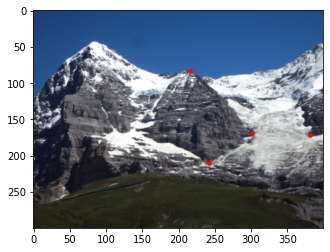

In [112]:
picked_corr_pts_h = [list(x) for x in picked_corr_pts_h]
picked_corr_pts_h = np.float32(picked_corr_pts_h)
#print(picked_dest_pts_h)
#return to inline
%matplotlib inline
#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts_h[:, 0],y= picked_corr_pts_h[:, 1], color='red', s=12)
plt.show()



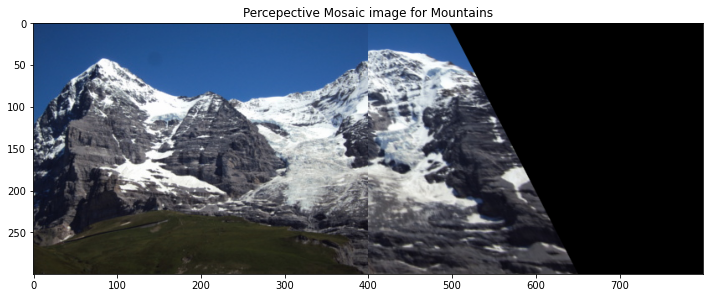

In [113]:
tran_homography = get_homography(picked_src_pts_h, picked_corr_pts_h)
tran_homography = np.append(tran_homography, 1.)
tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
transformed_img = cv.warpPerspective(temp_img2, tran_homography, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))

transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Percepective Mosaic image")
plt.show()


#### Path

In [238]:
temp_img1 = path1
temp_img2 = path2

In [239]:
picked_src_pts_h = pick_points_img(temp_img2[:, :, ::-1], 4)


Please click correspondances
clicked [(166.85592615526707, 338.41164030604205), (139.98803014242083, 269.8985054732842), (49.98057849938607, 193.32500183667253), (191.03703256682866, 327.6644819009036)]


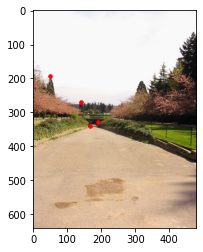

In [240]:
picked_src_pts_h = [list(x) for x in picked_src_pts_h]
picked_src_pts_h = np.float32(picked_src_pts_h)
#print(picked_src_pts_h)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts_h[:, 0],y= picked_src_pts_h[:, 1], color='red', s=12)
plt.show()


In [241]:
picked_corr_pts_h = pick_points_img(temp_img1[:, :, ::-1], 4) #getting correspondences from other image



Please click correspondances
clicked [(391.33719734259705, 338.41164030604205), (363.1259065291084, 268.5551106726419), (275.8052444873583, 197.35518623859946), (419.54848815608545, 330.3512715021882)]


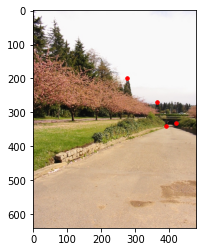

In [242]:
picked_corr_pts_h = [list(x) for x in picked_corr_pts_h]
picked_corr_pts_h = np.float32(picked_corr_pts_h)
#print(picked_dest_pts_h)
#return to inline
%matplotlib inline
#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts_h[:, 0],y= picked_corr_pts_h[:, 1], color='red', s=12)
plt.show()



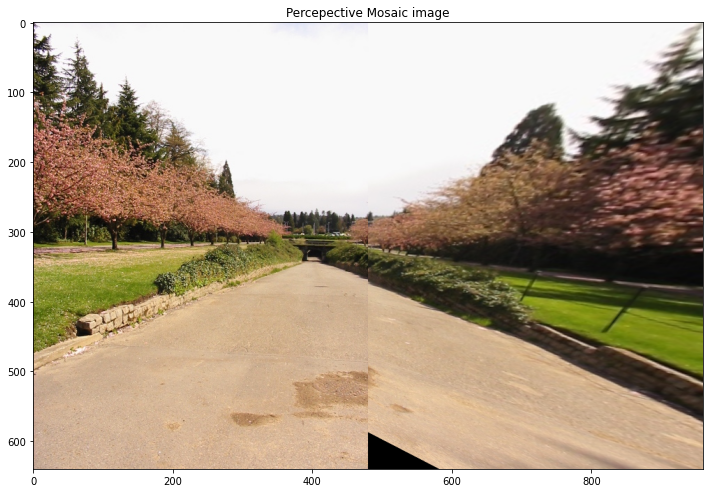

In [244]:
tran_homography = get_homography(picked_src_pts_h, picked_corr_pts_h)
tran_homography = np.append(tran_homography, 1.)
tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
transformed_img = cv.warpPerspective(temp_img2, tran_homography, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))

transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Percepective Mosaic image")
plt.show()


#### Cars

In [245]:
temp_img1 = cars1
temp_img2 = cars2

In [259]:
picked_src_pts_h = pick_points_img(temp_img2[:, :, ::-1], 4)


Please click correspondances
clicked [(217.4549570580789, 629.3828588629913), (177.1939881310741, 599.1871321677376), (260.2322365430216, 732.5515917384412), (323.1400004914667, 579.0566477042352)]


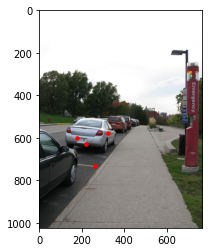

In [262]:
picked_src_pts_h = [list(x) for x in picked_src_pts_h]
picked_src_pts_h = np.float32(picked_src_pts_h)
#print(picked_src_pts_h)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts_h[:, 0],y= picked_src_pts_h[:, 1], color='red', s=12)
plt.show()


In [261]:
picked_corr_pts_h = pick_points_img(temp_img1[:, :, ::-1], 4) #getting correspondences from other image



Please click correspondances
clicked [(604.0067293313396, 627.1858221177811), (563.1721498255358, 595.1015096489353), (644.8413088371431, 735.105782240262), (709.0099337748347, 583.4344869329915)]


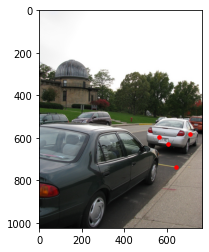

In [263]:
picked_corr_pts_h = [list(x) for x in picked_corr_pts_h]
picked_corr_pts_h = np.float32(picked_corr_pts_h)
#print(picked_dest_pts_h)
#return to inline
%matplotlib inline
#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts_h[:, 0],y= picked_corr_pts_h[:, 1], color='red', s=12)
plt.show()



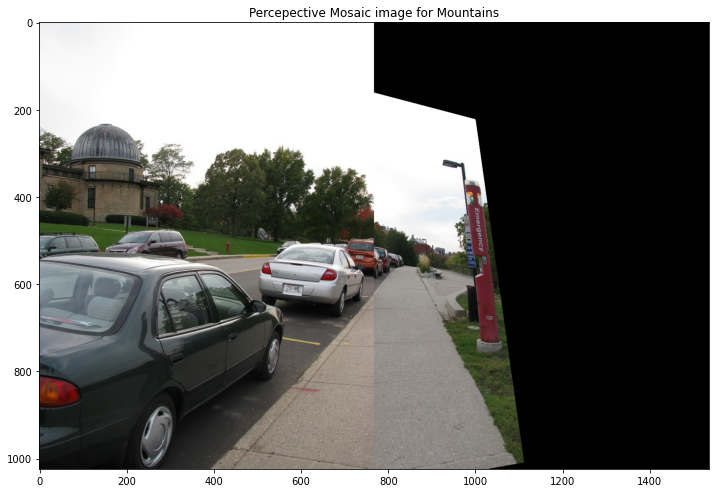

In [264]:
tran_homography = get_homography(picked_src_pts_h, picked_corr_pts_h)
tran_homography = np.append(tran_homography, 1.)
tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
transformed_img = cv.warpPerspective(temp_img2, tran_homography, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))

transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Percepective Mosaic image for Mountains")
plt.show()


#### Buildings

In [265]:
temp_img1 = building1
temp_img2 = building2

In [285]:
picked_src_pts_h = pick_points_img(temp_img2[:, :, ::-1], 4)


Please click correspondances
clicked [(548.219436560496, 827.0530326921055), (115.49789761379179, 280.23078944602116), (533.1495322190685, 344.81609376642484), (61.67681068012212, 895.9440239672027)]


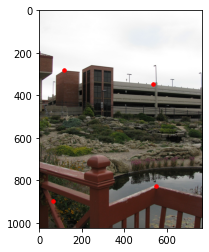

In [286]:
picked_src_pts_h = [list(x) for x in picked_src_pts_h]
picked_src_pts_h = np.float32(picked_src_pts_h)
#print(picked_src_pts_h)
#return to inline
%matplotlib inline

#showing picked points
plt.imshow(temp_img2[:, :, ::-1])
plt.scatter(x = picked_src_pts_h[:, 0],y= picked_src_pts_h[:, 1], color='red', s=12)
plt.show()


In [287]:
picked_corr_pts_h = pick_points_img(temp_img1[:, :, ::-1], 4) #getting correspondences from other image



Please click correspondances
clicked [(669.6667192263214, 829.2058761694523), (241.2508672343106, 284.5364764007147), (654.596814884894, 340.5104068117313), (187.4297803006409, 889.4854935351624)]


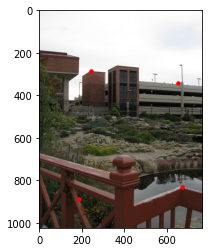

In [288]:
picked_corr_pts_h = [list(x) for x in picked_corr_pts_h]
picked_corr_pts_h = np.float32(picked_corr_pts_h)
#print(picked_dest_pts_h)
#return to inline
%matplotlib inline
#showing picked points
plt.imshow(temp_img1[:, :, ::-1])
plt.scatter(x = picked_corr_pts_h[:, 0],y= picked_corr_pts_h[:, 1], color='red', s=12)
plt.show()



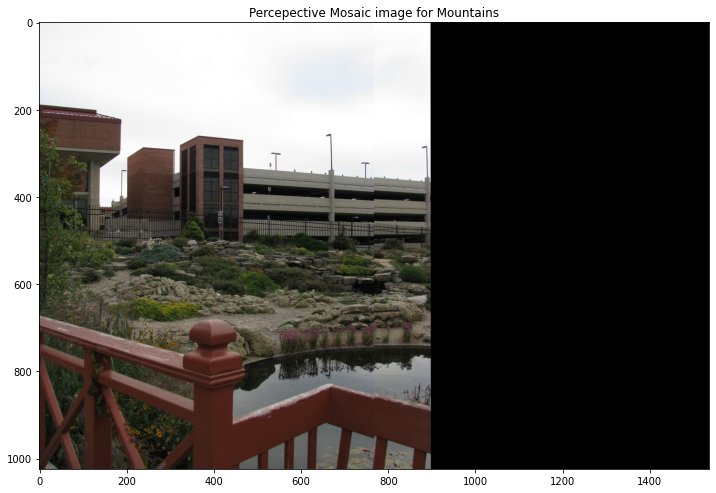

In [289]:
tran_homography = get_homography(picked_src_pts_h, picked_corr_pts_h)
tran_homography = np.append(tran_homography, 1.)
tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
transformed_img = cv.warpPerspective(temp_img2, tran_homography, (temp_img2.shape[1] + temp_img1.shape[1], temp_img2.shape[0]))

transformed_img[:temp_img1.shape[0], :temp_img1.shape[1], :] = temp_img1
plt.figure(figsize=(12,12))
plt.imshow(transformed_img[:, :, ::-1])
plt.title("Percepective Mosaic image for Mountains")
plt.show()


## Extra Credit - Harris Corner (Note: it can take up to 5 minutes to run)

In [167]:


def local2d_nonmax_sup(arr, NHoodSize):
    '''
    Performs local non-max suppression on a 2D array in a certain window/hood size
    arr: 2D array to run non-max sup on
    NHoodSize: window size for non-max suppression algorithm. https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c
    Returns: non-max suppressed array with same dims as arr
    '''
    assert len(arr.shape) == 2
    dX = NHoodSize # for clarity and shortness
    dY = NHoodSize 
    M, N = arr.shape #row & col
    for x in range(0,M-dX+1): #iterating over elements of array
        for y in range(0,N-dY+1):
            window = arr[x:x+dX, y:y+dY]
            if np.sum(window)==0: #check if window has elements that are all 0
                localMax=0
            else:
                localMax = np.amax(window) #find max element in array. 
            maxCoord=np.unravel_index(np.argmax(window), window.shape) + np.array((x,y)) #needed to get index of max element

            arr[x:x+dX, y:y+dY]=0 #suppress all elements by setting equal to 0
            arr[tuple(maxCoord)] = localMax #reset only the max
    return arr
    
def correspondance_ssd_matcher(gray_img1, gray_img2, dst1, dst2, win_size): 
    '''
    Runs Sum of Square Difference algorithm on corner points dst1, dst2. Uses feature descriptors that are win_size by win_size patches
    centered around each corner point. Subtracts the mean and standard deviation for normalizing each patch. Compares both patches
    using SSD. Filters corner points further using heuristic: if pt < 5*(min pt): continue, else: drop
    gray_img1, gray_img2: grayscale 2D images to use for SSD
    dst1, dst2: corner points for gray_img1 and gray_img2 respectively
    win_size: window size of patch for comparing feature points of images 
    Returns: list of tuples of form (k, l, e) where k is filtered corner pts of gray_img1, where l is filtered corner pts of gray_img2, e is error as calculated by SSD
    the list of tuples is sorted by error in ascending order
    This function takes a long time to compute, more than 5 minutes sometimes. 
    '''
    assert len(gray_img1.shape) == len(gray_img2.shape) == 2
    # running SSD algorithm see: https://cs.brown.edu/courses/csci1950-g/results/proj6/edwallac/
    
    gray_img1 = np.pad(gray_img1,win_size,mode='constant' ) #padding the image just in case patch goes out of image boundary
    gray_img2 = np.pad(gray_img2,win_size,mode='constant' )

    corr_pts1 = []
    corr_pts2 = []
    
    
    unfiltered_pts1 = []
    unfiltered_pts2 = []

    error = []

    # get coordinates of feature points of img1
    for i in range(dst1.shape[0]): 
      for j in range(dst1.shape[1]):
        if dst1[i, j]>0: 
          unfiltered_pts1.append((i, j))

    # get coordinates of feature points of img2
    for i in range(dst2.shape[0]): 
      for j in range(dst2.shape[1]):
        if dst2[i, j]>0: 
          unfiltered_pts2.append((i, j)) 
    print(len(unfiltered_pts1))
    
    # filter elements based on SSD
    
    for pt1 in unfiltered_pts1: 
      for pt2 in unfiltered_pts2:
        #print("x1", pt1[0], "y1", pt1[1], "x2", pt2[0], "y2", pt2[1]) 
        patch_from_img1 = gray_img1[pt1[0]-win_size//2+win_size:pt1[0]+win_size//2+win_size, pt1[1]-win_size//2+win_size:pt1[1]+win_size//2+win_size]
        patch_from_img2 = gray_img2[pt2[0]-win_size//2+win_size:pt2[0]+win_size//2+win_size, pt2[1]-win_size//2+win_size:pt2[1]+win_size//2+win_size]
        patch_from_img1 -= patch_from_img1.mean() - np.std(patch_from_img1)
        patch_from_img2 -= patch_from_img2.mean() - np.std(patch_from_img2)

        assert patch_from_img1.shape == patch_from_img2.shape # must be a win_size x win_size size patch
        ssd = np.sum((patch_from_img1 - patch_from_img2)**2) 
        #print("SSD", ssd)
        corr_pts1.append([pt1[0], pt1[1]])
        corr_pts2.append([pt2[0], pt2[1]])
        error.append(ssd)
    
    assert len(corr_pts1) == len(error) == len(corr_pts2) !=0  #make sure there are the same number of points and corresponding ssd errors and not 0

    filtered_pts1 = []
    filtered_pts2 = []
    error_ssd = []

    for i in range(len(error)):
      if error[i]<5*min(error): 
        error_ssd.append(error[i])
        filtered_pts1.append(corr_pts1[i])
        filtered_pts2.append(corr_pts2[i])
    zip_pts = zip(filtered_pts1,filtered_pts2,error_ssd)
    print(len(filtered_pts1), len(filtered_pts2), len(error_ssd))
    return sorted(zip_pts, key = lambda x : x[2])
    



def correspondance_matcher(img1, img2, corn_thresh = 0.01, ssd_thresh = 80, win_size = 12):
    '''
    Uses Harris Corner detection algorithm to get point correspondances in two images in an autonomous way
    img1, img2: two images of same width and height to match
    ssd_thresh: threshold for SSD (not used)
    win_size: window size of patch for SSD to compare feature points of the two images 
    Returns: Image of same dimensions as img1/2 that is stiched by the best match from the harris corner detector
    This function takes a long time to compute, more than 5 minutes sometimes. 
    '''
    assert img1.shape == img2.shape
    if (len(img1.shape) == 3): 
        gray_img1 = cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
    elif (len(img1.shape) == 2): 
        gray_img1 = img1.copy()
    else: 
        raise ValueError("images not 2D or 3D, pass 3 channel color image or gray scale image only")
    gray_img1 = np.float32(gray_img1)
    dst1 = cv.cornerHarris(gray_img1,2,3,0.04) #run builtin harris corner detector

    #result is dilated for marking the corners, not important
    dst1 = cv.dilate(dst1,None)
    # Threshold for an optimal value
    dst1[dst1<corn_thresh*dst1.max()] = 0
    # Local Non max suppression window size 25
    dst1 = local2d_nonmax_sup(dst1, 25)
   
    # Harris Corner on second img
    
    if (len(img2.shape) == 3): 
        gray_img2 = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
    elif (len(img2.shape) == 2): 
        gray_img2 = img2.copy()
    else: 
        raise ValueError("images not 2D or 3D, pass 3 channel color image or gray scale image only")
    gray_img2 = np.float32(gray_img2)
    
    dst2 = cv.cornerHarris(gray_img2,2,3,0.04) #run Harris Corner detector on second image
    dst2 = cv.dilate(dst2,None) # Useful but not necessary to better get correspondances see https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_features_harris/py_features_harris.html

    # Threshold for an optimal value
    dst2[dst2<corn_thresh*dst2.max()] = 0
    # Local Non max suppression window size 25
    dst2 = local2d_nonmax_sup(dst2, 25)

    # just to help with plotting feature points
    axis_x = np.arange(dst1.shape[1])
    axis_y = np.arange(dst1.shape[0])
    x_coord, y_coord = np.meshgrid(axis_x, axis_y)

    # plot feature points in first image
    plt.scatter(x_coord[dst1>0], y_coord[dst1>0],  color='red', s=12)
    plt.imshow(img1[:, :, ::-1])
    plt.show()
    # plot features points in second image
    plt.scatter(x_coord[dst2>0], y_coord[dst2>0],  color='red', s=12)
    plt.imshow(img2[:, :, ::-1])
    plt.show()
    
    # getting feature matches in sorted form (ascending)
    feature_matches = correspondance_ssd_matcher(gray_img1, gray_img2, dst1, dst2, win_size)
    # plotting line plot of correspondences
    
    # combining two images
    combined_img = np.hstack((img1, img2))
    #plt.imshow(combined_img[:, :, ::-1])
    #plt.show()
    
    print(combined_img.shape)
    for x in feature_matches: 
      cv.line(combined_img, (x[0][1], x[0][0]),(x[1][1]+img1.shape[1], x[1][0]),(0, 0, 255), 2 )
    plt.figure(figsize=(15, 15))
    plt.imshow(combined_img[:, :, ::-1])
    plt.title("Correspondences between two images ")
    plt.show()
    unzip_feature_matches = zip(*feature_matches) # it comes zipped
    corr_pts, src_pts, ssn_error = unzip_feature_matches
    
    corr_pts = np.float32([x[::-1] for x in corr_pts]) #reversing coordinates from (row, column) to (x, y)
    src_pts = np.float32([x[::-1] for x in src_pts]) 
    ssn_error = np.asarray(ssn_error) 

    # Solve homography transformation matrix
    if len(feature_matches) >=4: 
      tran_homography = get_homography(src_pts[:4], corr_pts[:4]) #solve transformation matrix with our function
      tran_homography = np.append(tran_homography, 1.)
      tran_homography = tran_homography.reshape((-1,3)) #reshaping to 3 by 3 matrix
      transformed_img = cv.warpPerspective(img2, tran_homography, (img2.shape[1] + img1.shape[1], img2.shape[0])) #applying homography on img2
      transformed_img[:img1.shape[0], :img1.shape[1], :] = img1 #mosaicing img1 and img2
      return transformed_img
    else: 
      print(f"Too few correspondances found ({len(feature_matches)} matches), change parameters and try again!")
      return None




    

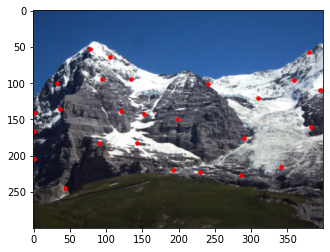

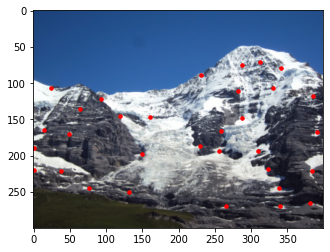

26
5 5 5
(300, 800, 3)


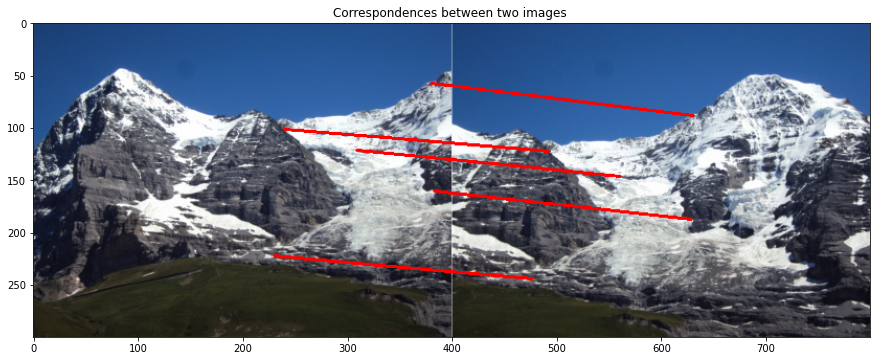

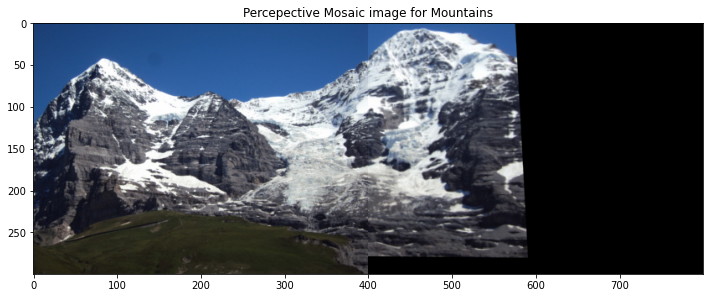

In [124]:
blended_img_mt = correspondance_matcher(mt1, mt2, 0.2,80, 12) 
plt.figure(figsize=(12,12))
plt.imshow(blended_img_mt[:, :, ::-1])
plt.title("Percepective Mosaic image for Mountains")
plt.show()

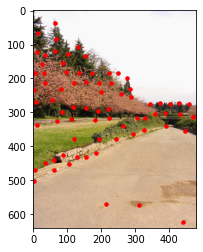

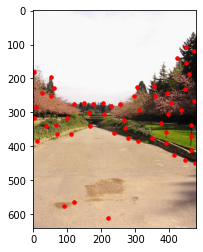

74
11 11 11
(640, 960, 3)


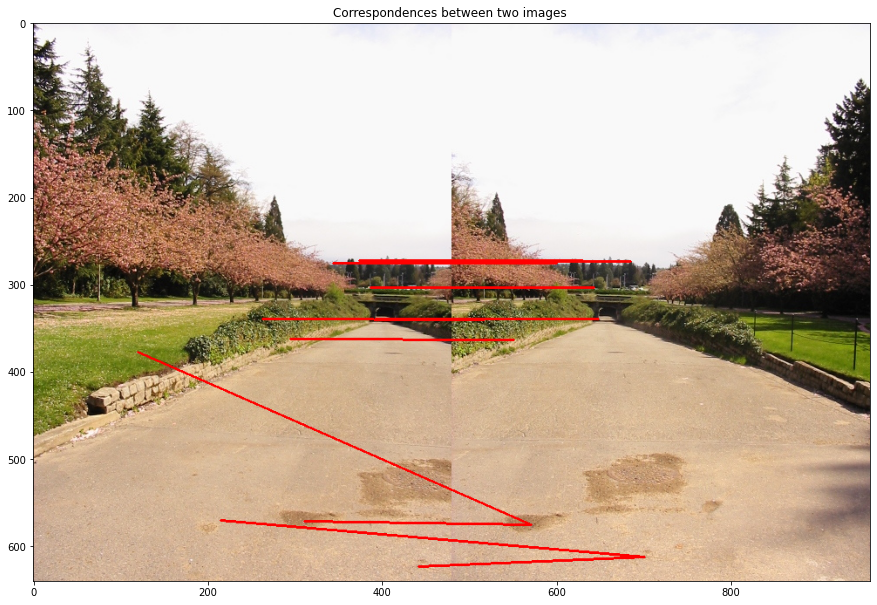

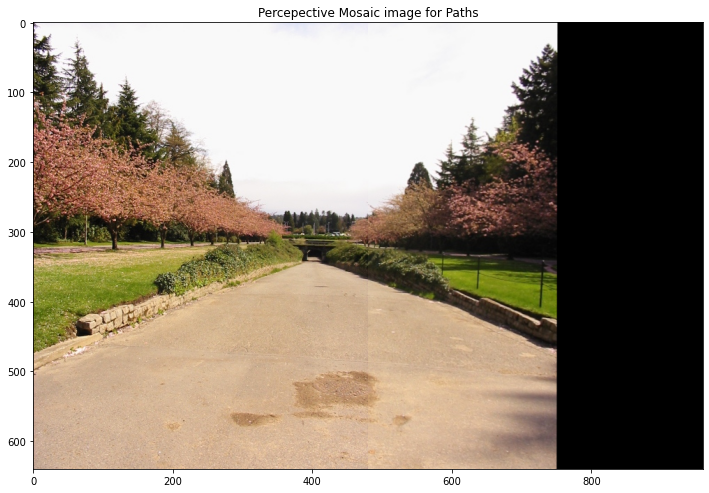

In [125]:
blended_img_path = correspondance_matcher(path1, path2, 0.01,80, 12) 
plt.figure(figsize=(12,12))
plt.imshow(blended_img_path[:, :, ::-1])
plt.title("Percepective Mosaic image for Paths")
plt.show()

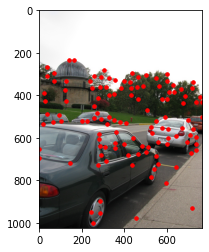

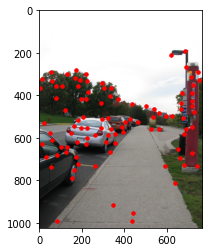

121
12 12 12
(1024, 1536, 3)


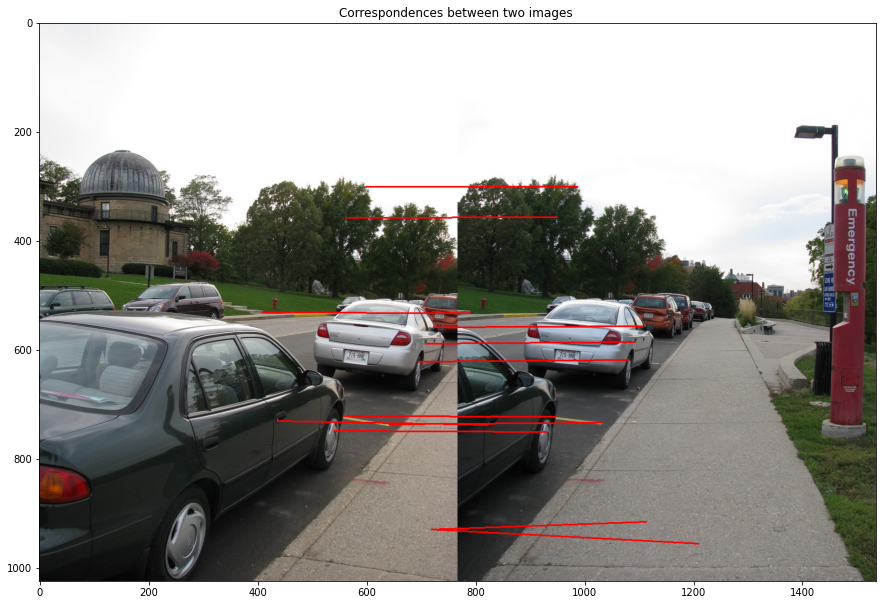

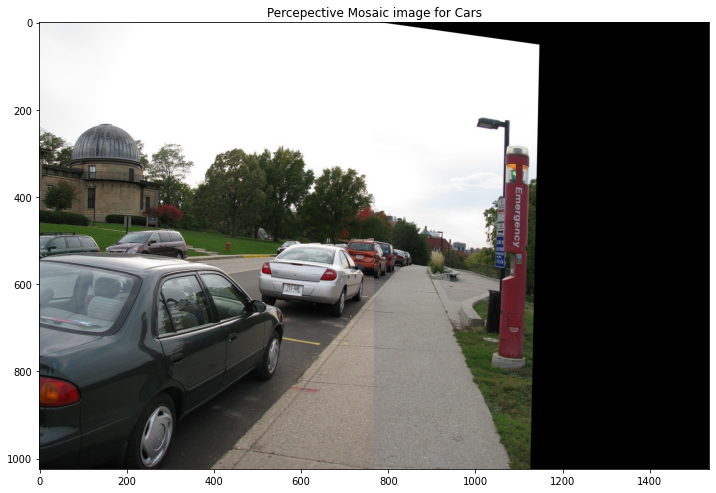

In [126]:
blended_img_cars = correspondance_matcher(cars1, cars2, 0.01,80, 12) 
plt.figure(figsize=(12,12))
plt.imshow(blended_img_cars[:, :, ::-1])
plt.title("Percepective Mosaic image for Cars")
plt.show()

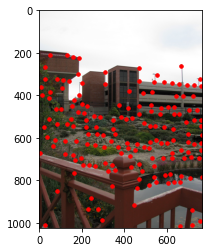

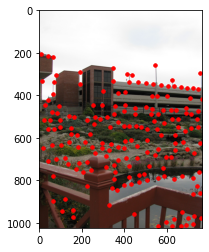

168
13 13 13
(1024, 1536, 3)


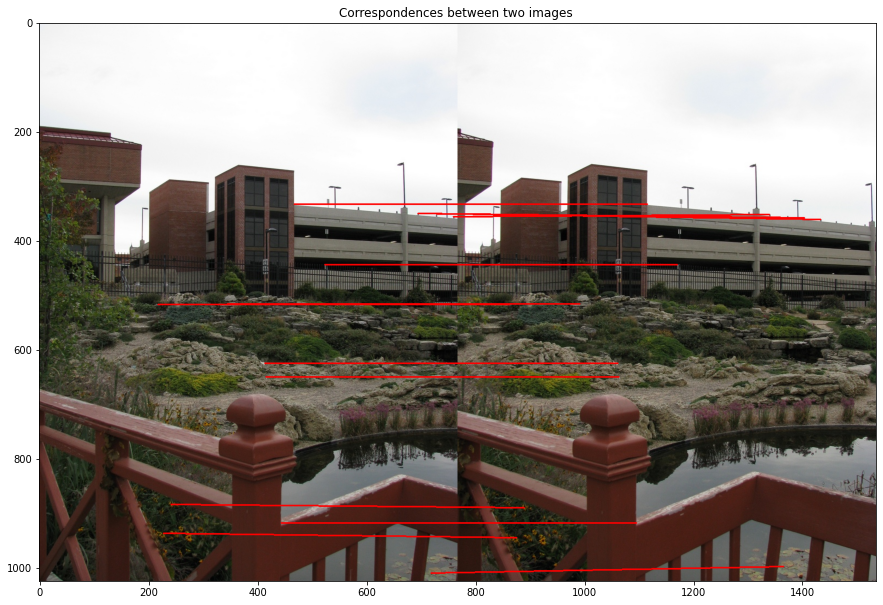

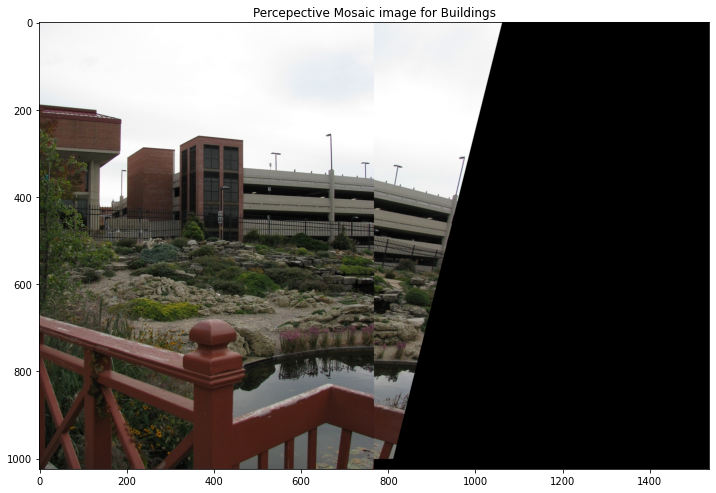

In [127]:
blended_img_building = correspondance_matcher(building1, building2, 0.01,80, 12) 
plt.figure(figsize=(12,12))
plt.imshow(blended_img_building[:, :, ::-1])
plt.title("Percepective Mosaic image for Buildings")
plt.show()